<a href="https://colab.research.google.com/github/zjminglead/BESTORE/blob/master/online_shopper_intention.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# 线上顾客购买行为分析

## 描述

该项目的目标是确定以下哪种分类算法可以最好地预测在线购物者进行购买的可能性：
* （1）随机森林分类器
* （2）支持向量机
* （3）K 最近邻
* （4）逻辑回归 


**数据集**

使用关于购物者行为的时间序列数据集。
* 该数据集跨越 10 个月，包括 18 个变量
* 其中包括目标变量：Revenue。


**分析结构**

该分析采用以下结构：

     1. 数据可视化。
     2. 特征工程。
     3. 交叉验证。
     4. 结论。

**相关结论**

我使用 f1 分数作为指标来比较上述算法。我发现随机森林分类器的 f1 分数最高。

## 导入数据和依赖包

### 1.导入相关依赖包

In [2]:
import os  # 文件系统包
import zipfile  #解压zip包
# 数据操作基本库
import numpy as np  
import pandas as pd

# 可视化库
import matplotlib.pyplot as plt
import seaborn as sns
import plotly as py
import plotly.graph_objs as go


### 2.绘图等全局设置

In [3]:
%matplotlib inline
sns.set_style("whitegrid")
sns.set_palette("Blues_d")
%config InlineBackend.figure_format = 'svg'

### 3.添加工作路径

In [4]:
from google.colab import drive
drive.mount('/content/drive')
ROOT = "/content/drive"
PROJ = "MyDrive/BESTROE/machine_learning/consumer_hub/online_shoppers_intention" # This is a custom path.
PROJECT_PATH = os.path.join(ROOT, PROJ)

os.chdir(PROJECT_PATH)
print(os.getcwd())
!ls

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
/content/drive/MyDrive/BESTROE/machine_learning/consumer_hub/online_shoppers_intention
online_shopper_intention.ipynb	online_shoppers_intention.csv.zip
online_shoppers_intention.csv	online_shoppers_intention.ipynb


### 4.数据集介绍

**类别信息**

* * 数据集由 10 个数值属性和 8 个分类属性组成。
* 'Revenue' 属性可用作类别标签。 
* 
  - "Administrative"
  - "Administrative Duration", 
  - "Informational", 
  - "Informational Duration"
  - "Product Related"
  - "Product Related Duration" 
  
  表示访问者在该会话中访问的不同类型页面的数量，以及在每个页面类别中花费的总时间。这些特性的值来自用户访问的页面的URL信息，并在用户采取操作(例如从一个页面移动到另一个页面)时实时更新。
  
   - "Bounce Rate", （　Bounce Rate的大小说明了网站Landing Page（入口页面）的质量。）
   - "Exit Rate",（Exit Rate的大小则直接说明了每个页面的内容质量的好坏。）
   - "Page Value"
   三个特征代表了“谷歌分析”对电子商务网站中每个页面所测量的指标。[页面质量](http://www.chinawebanalytics.cn/bounce-rate%E5%92%8Cexit-rate%E2%80%94%E2%80%94%E8%A1%A1%E9%87%8F%E9%A1%B5%E9%9D%A2%E8%B4%A8%E9%87%8F%E7%9A%84%E5%AD%AA%E7%94%9F%E5%85%84%E5%BC%9F/)
   
   + 网页“Bounce Rate”特征的值是指从该页面进入网站，然后离开(“Bounce”)而在该会话期间没有向分析服务器触发任何其他请求的访问者的百分比。(Bounce Rate是指对某个网站的访问中，“Bounce掉”的访问占总访问数量的百分比。计算的方法一般使用Visit来计算。即：Bounce Rate = 只浏览了一个页面的Visits / 全部的Visits；)
   + 特定网页的“Exit Rate”特征的值是根据该网页的所有页面浏览量计算的，即最后一次访问的百分比。
   + “Page Value”特征表示用户在完成电子商务交易前访问的网页的平均价值。
   
  
  
   - "Special Day" 

   功能表示站点访问时间与特定的特殊日子（例如母亲节、情人节）的接近程度，在这些日子里，会话更有可能通过交易完成。 该属性的值是通过考虑电子商务的动态（例如订单日期和交货日期之间的持续时间）来确定的。

   该数据集还包括操作 系统、浏览器、区域、流量类型、访客类型为回访者或新访客、指示访问日期是否为周末的布尔值以及一年中的月份。



### 5.数据解压与读取

In [9]:
# 查看zip包中的信息
file_dir = 'online_shoppers_intention.csv.zip'
zip_File = zipfile.ZipFile(file_dir,'r')
zip_list = zip_File.namelist()

#打印列表信息
print(zip_list)

#解压
zip_File.extractall()
!ls

['online_shoppers_intention.csv']
online_shopper_intention.ipynb	online_shoppers_intention.csv.zip
online_shoppers_intention.csv	online_shoppers_intention.ipynb


In [5]:
data = pd.read_csv("online_shoppers_intention.csv")

## 数据集理解

### 1.数据整体统计信息理解

In [14]:
# 数据预览
data.head()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,Month,OperatingSystems,Browser,Region,TrafficType,VisitorType,Weekend,Revenue
0,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,1,1,1,1,Returning_Visitor,False,False
1,0,0.0,0,0.0,2,64.000000,0.00,0.10,0.0,0.0,Feb,2,2,1,2,Returning_Visitor,False,False
2,0,0.0,0,0.0,1,0.000000,0.20,0.20,0.0,0.0,Feb,4,1,9,3,Returning_Visitor,False,False
3,0,0.0,0,0.0,2,2.666667,0.05,0.14,0.0,0.0,Feb,3,2,2,4,Returning_Visitor,False,False
4,0,0.0,0,0.0,10,627.500000,0.02,0.05,0.0,0.0,Feb,3,3,1,4,Returning_Visitor,True,False


In [22]:
print("This data set has {} rows and {} columns.".format(data.shape[0], data.shape[1]))

This data set has 12330 rows and 18 columns.


In [16]:
data.dtypes

Administrative               int64
Administrative_Duration    float64
Informational                int64
Informational_Duration     float64
ProductRelated               int64
ProductRelated_Duration    float64
BounceRates                float64
ExitRates                  float64
PageValues                 float64
SpecialDay                 float64
Month                       object
OperatingSystems             int64
Browser                      int64
Region                       int64
TrafficType                  int64
VisitorType                 object
Weekend                       bool
Revenue                       bool
dtype: object

In [15]:
# 数值类型信息描述
data.describe()

,Administrative,Administrative_Duration,Informational,Informational_Duration,ProductRelated,ProductRelated_Duration,BounceRates,ExitRates,PageValues,SpecialDay,OperatingSystems,Browser,Region,TrafficType
count,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000,12330.000000
mean,2.315166,80.818611,0.503569,34.472398,31.731468,1194.746220,0.022191,0.043073,5.889258,0.061427,2.124006,2.357097,3.147364,4.069586
std,3.321784,176.779107,1.270156,140.749294,44.475503,1913.669288,0.048488,0.048597,18.568437,0.198917,0.911325,1.717277,2.401591,4.025169
min,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,1.000000,1.000000,1.000000
25%,0.000000,0.000000,0.000000,0.000000,7.000000,184.137500,0.000000,0.014286,0.000000,0.000000,2.000000,2.000000,1.000000,2.000000
50%,1.000000,7.500000,0.000000,0.000000,18.000000,598.936905,0.003112,0.025156,0.000000,0.000000,2.000000,2.000000,3.000000,2.000000
75%,4.000000,93.256250,0.000000,0.000000,38.000000,1464.157213,0.016813,0.050000,0.000000,0.000000,3.000000,2.000000,4.000000,4.000000
max,27.000000,3398.750000,24.000000,2549.375000,705.000000,63973.522230,0.200000,0.200000,361.763742,1.000000,8.000000,13.000000,9.000000,20.000000


In [24]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 12330 entries, 0 to 12329
Data columns (total 18 columns):
 #   Column                   Non-Null Count  Dtype  
---  ------                   --------------  -----  
 0   Administrative           12330 non-null  int64  
 1   Administrative_Duration  12330 non-null  float64
 2   Informational            12330 non-null  int64  
 3   Informational_Duration   12330 non-null  float64
 4   ProductRelated           12330 non-null  int64  
 5   ProductRelated_Duration  12330 non-null  float64
 6   BounceRates              12330 non-null  float64
 7   ExitRates                12330 non-null  float64
 8   PageValues               12330 non-null  float64
 9   SpecialDay               12330 non-null  float64
 10  Month                    12330 non-null  object 
 11  OperatingSystems         12330 non-null  int64  
 12  Browser                  12330 non-null  int64  
 13  Region                   12330 non-null  int64  
 14  TrafficType           

In [17]:
# 缺失值信息
missing_percentage = data.isnull().sum()/data.shape[0]
print(missing_percentage)

Administrative             0.0
Administrative_Duration    0.0
Informational              0.0
Informational_Duration     0.0
ProductRelated             0.0
ProductRelated_Duration    0.0
BounceRates                0.0
ExitRates                  0.0
PageValues                 0.0
SpecialDay                 0.0
Month                      0.0
OperatingSystems           0.0
Browser                    0.0
Region                     0.0
TrafficType                0.0
VisitorType                0.0
Weekend                    0.0
Revenue                    0.0
dtype: float64


### 2.数据的单变量分析

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variable as a keyword arg: x. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



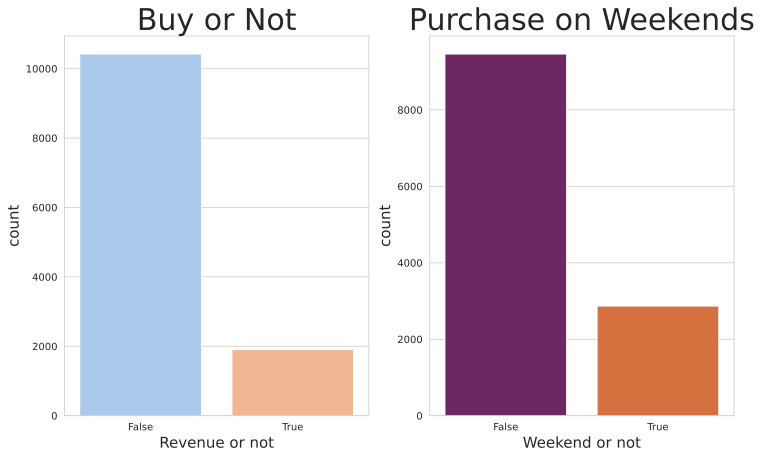

In [21]:
# checking the Distribution of customers on Revenue

plt.rcParams['figure.figsize'] = (12, 7)

plt.subplot(1, 2, 1)
sns.countplot(data['Revenue'], palette = 'pastel')
plt.title('Buy or Not', fontsize = 30)
plt.xlabel('Revenue or not', fontsize = 15)
plt.ylabel('count', fontsize = 15)


# checking the Distribution of customers on Weekend
plt.subplot(1, 2, 2)
sns.countplot(data['Weekend'], palette = 'inferno')
plt.title('Purchase on Weekends', fontsize = 30)
plt.xlabel('Weekend or not', fontsize = 15)
plt.ylabel('count', fontsize = 15)

plt.show()

In [25]:
# 访客类型分为回访客，新访客和其他
data['VisitorType'].value_counts()

Returning_Visitor    10551
New_Visitor           1694
Other                   85
Name: VisitorType, dtype: int64

In [27]:
# 浏览器类型
data['Browser'].value_counts()

2     7961
1     2462
4      736
5      467
6      174
10     163
8      135
3      105
13      61
7       49
12      10
11       6
9        1
Name: Browser, dtype: int64

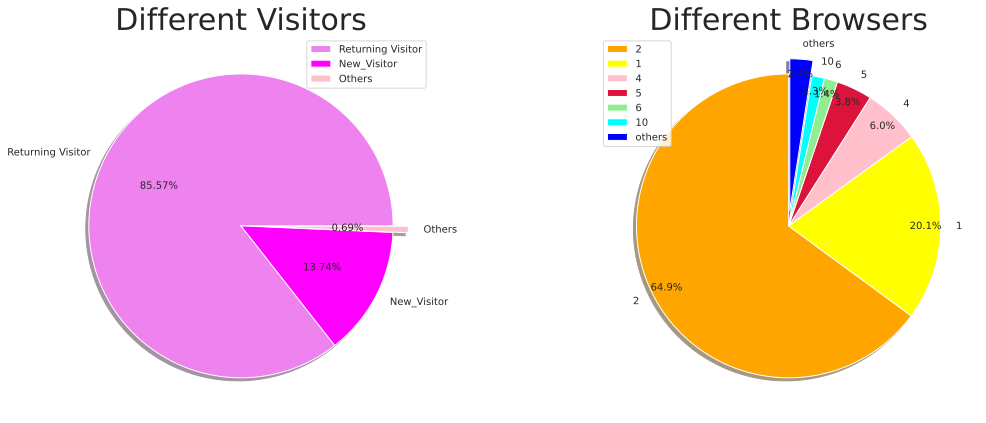

In [32]:
# 画访客类型饼图分布

plt.rcParams['figure.figsize'] = (18, 7)
size = [10551, 1694, 85]
colors = ['violet', 'magenta', 'pink']
labels = "Returning Visitor", "New_Visitor", "Others"
explode = [0, 0, 0.1] # 使other离开圆心一点距离

plt.subplot(1, 2, 1)
plt.pie(size, colors = colors, labels = labels, explode = explode, shadow = True, autopct = '%.2f%%')
plt.title('Different Visitors', fontsize = 30)
plt.axis('off')
plt.legend()

# plotting a pie chart for browsers
size = [7961, 2462, 736, 467, 174, 163, 300]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen', 'cyan', 'blue']
labels = "2", "1","4","5","6","10","others"
explode = [0, 0, 0, 0, 0, 0, 0.1] # 使other离开圆心一点距离

plt.subplot(1, 2, 2)
plt.pie(size, colors = colors, labels = labels, explode = explode, shadow = True,  autopct = '%.1f%%', startangle = 90, pctdistance = 0.9)
plt.title('Different Browsers', fontsize = 30)
plt.axis('off')
plt.legend()
plt.show()

In [33]:
data['TrafficType'].value_counts()

2     3913
1     2451
3     2052
4     1069
13     738
10     450
6      444
8      343
5      260
11     247
20     198
9       42
7       40
15      38
19      17
14      13
18      10
16       3
12       1
17       1
Name: TrafficType, dtype: int64

In [34]:
data['Region'].value_counts()

1    4780
3    2403
4    1182
2    1136
6     805
7     761
9     511
8     434
5     318
Name: Region, dtype: int64

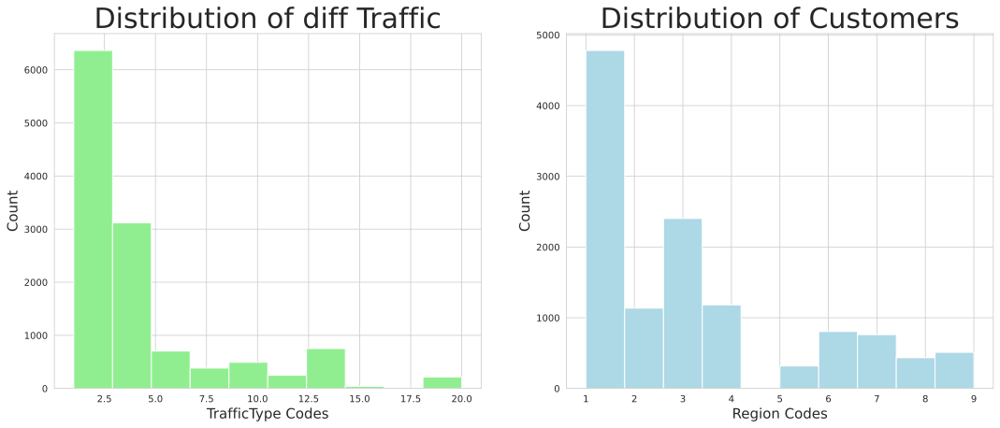

In [35]:
# 消费者的流量类型分布

plt.rcParams['figure.figsize'] = (18, 7)

plt.subplot(1, 2, 1)
plt.hist(data['TrafficType'], color = 'lightgreen')
plt.title('Distribution of diff Traffic',fontsize = 30)
plt.xlabel('TrafficType Codes', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

# 消费者的区域分布

plt.subplot(1, 2, 2)
plt.hist(data['Region'], color = 'lightblue')
plt.title('Distribution of Customers',fontsize = 30)
plt.xlabel('Region Codes', fontsize = 15)
plt.ylabel('Count', fontsize = 15)

plt.show()

In [36]:
# 用户使用的操作系统

data['OperatingSystems'].value_counts()

2    6601
1    2585
3    2555
4     478
8      79
6      19
7       7
5       6
Name: OperatingSystems, dtype: int64

In [37]:
# 查看访问在线购物网站的客户数量最多的月份

data['Month'].value_counts()

May     3364
Nov     2998
Mar     1907
Dec     1727
Oct      549
Sep      448
Aug      433
Jul      432
June     288
Feb      184
Name: Month, dtype: int64


plt.gcf().gca().add_artist(circle1)

gcf()表示获取当前图形


gca()表示获取当前轴

[画圆和圆环](https://www.codenong.com/9215658/)


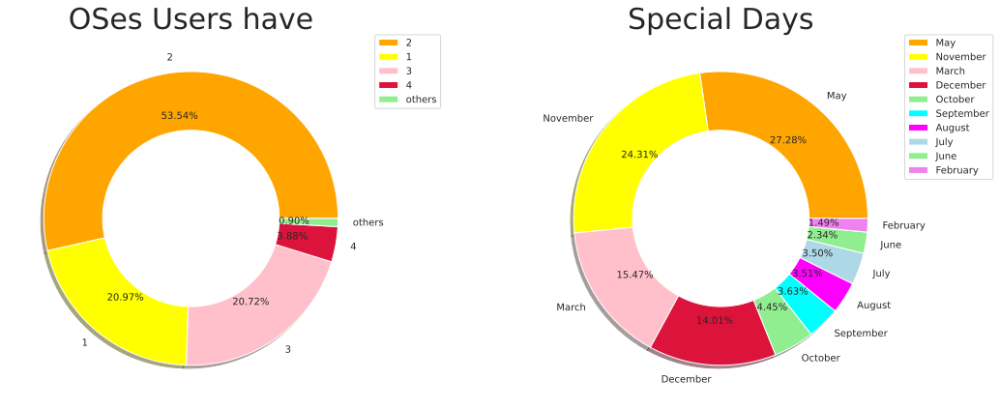

In [49]:
# 为月份的变化创建一个圆环图

# 其实是两个圆的叠加
# 先画一个圆
circle = plt.Circle((0, 0), 0.6, color = 'white')

# 按浏览器进行用户分组
size = [6601, 2585, 2555, 478, 111]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen']
labels = "2", "1","3","4","others"
explode = [0, 0, 0, 0, 0]

plt.subplot(1, 2, 1)
plt.pie(size, colors = colors, labels = labels, explode = explode, shadow = True, autopct = '%.2f%%', pctdistance = 0.7)
plt.title('OSes Users have', fontsize = 30)
p = plt.gcf()
p.gca().add_artist(circle) #您需要将其添加到轴。Circle是Artist的子类，而axes具有add_artist方法。
plt.axis('off')
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)

# 按照月份进行分组

circle = plt.Circle((0, 0), 0.6, color = 'white')


size = [3364, 2998, 1907, 1727, 549, 448, 433, 432, 288, 184]
colors = ['orange', 'yellow', 'pink', 'crimson', 'lightgreen', 'cyan', 'magenta', 'lightblue', 'lightgreen', 'violet']
labels = "May", "November", "March", "December", "October", "September", "August", "July", "June", "February"
explode = [0, 0, 0, 0, 0, 0, 0, 0, 0, 0]

plt.subplot(1, 2, 2)
plt.pie(size, colors = colors, labels = labels, explode = explode, shadow = True, autopct = '%.2f%%', pctdistance = 0.7)
plt.title('Special Days', fontsize = 30)

p = plt.gcf()
p.gca().add_artist(circle)
plt.axis('off')
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)

plt.show()



### 3.数据的双变量分析

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning

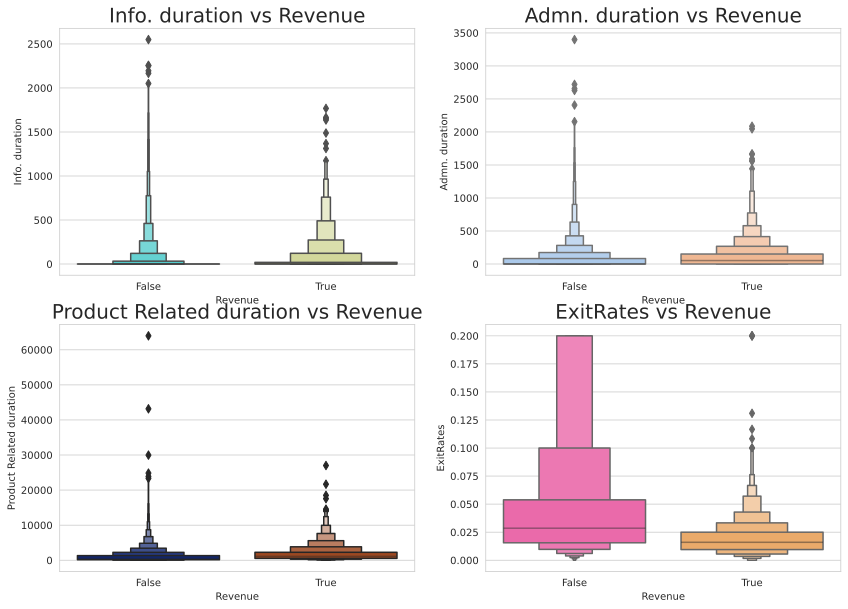

In [9]:
# 根据分类变量分组绘制一个纵向的增强箱型图(https://www.jianshu.com/p/a12e4bfbd628)
# product related duration vs revenue


plt.rcParams['figure.figsize'] = (14, 10)

plt.subplot(2, 2, 1)
sns.boxenplot(data['Revenue'], data['Informational_Duration'], palette = 'rainbow')
plt.title('Info. duration vs Revenue', fontsize = 20)
plt.xlabel('Revenue', fontsize = 10)
plt.ylabel('Info. duration', fontsize = 10)

# product related duration vs revenue

plt.subplot(2, 2, 2)
sns.boxenplot(data['Revenue'], data['Administrative_Duration'], palette = 'pastel')
plt.title('Admn. duration vs Revenue', fontsize = 20)
plt.xlabel('Revenue', fontsize = 10)
plt.ylabel('Admn. duration', fontsize = 10)

# product related duration vs revenue

plt.subplot(2, 2, 3)
sns.boxenplot(data['Revenue'], data['ProductRelated_Duration'], palette = 'dark')
plt.title('Product Related duration vs Revenue', fontsize = 20)
plt.xlabel('Revenue', fontsize = 10)
plt.ylabel('Product Related duration', fontsize = 10)

# exit rate vs revenue

plt.subplot(2, 2, 4)
sns.boxenplot(data['Revenue'], data['ExitRates'], palette = 'spring')
plt.title('ExitRates vs Revenue', fontsize = 20)
plt.xlabel('Revenue', fontsize = 10)
plt.ylabel('ExitRates', fontsize = 10)


plt.show()


In [10]:
# stripplot(分布散点图)(https://zhuanlan.zhihu.com/p/38295294)
# page values vs revenue

plt.rcParams['figure.figsize'] = (14, 7)

plt.subplot(1, 2, 1)
sns.stripplot(data['Revenue'], data['PageValues'], palette = 'autumn')
plt.title('PageValues vs Revenue', fontsize = 30)
plt.xlabel('Revenue', fontsize = 15)
plt.ylabel('PageValues', fontsize = 15)

# bounce rates vs revenue
plt.subplot(1, 2, 2)
sns.stripplot(data['Revenue'], data['BounceRates'], palette = 'magma')
plt.title('Bounce Rates vs Revenue', fontsize = 30)
plt.xlabel('Revenue', fontsize = 15)
plt.ylabel('Bounce Rates', fontsize = 15)

plt.show()

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.

/usr/local/lib/python3.7/dist-packages/seaborn/_decorators.py:43: FutureWarning:

Pass the following variables as keyword args: x, y. From version 0.12, the only valid positional argument will be `data`, and passing other arguments without an explicit keyword will result in an error or misinterpretation.



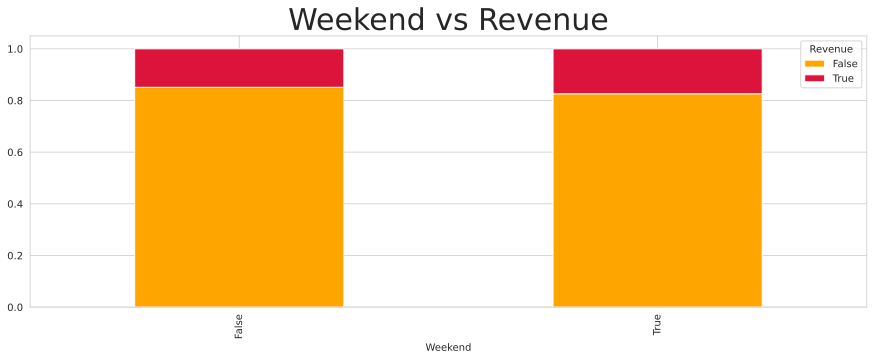

Revenue,False,True
Weekend,,
False,8053,1409
True,2369,499


In [12]:
# weekend vs Revenue
# 交叉表是用于统计分组频率的特殊透视表
# 按照'Weekend'分组，统计各个分组种'Revenue'的频数
df = pd.crosstab(data['Weekend'], data['Revenue'])
# 频数归一化（df/(df+1)）
df.div(df.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['orange', 'crimson'])
plt.title('Weekend vs Revenue', fontsize = 30)
plt.show()
df

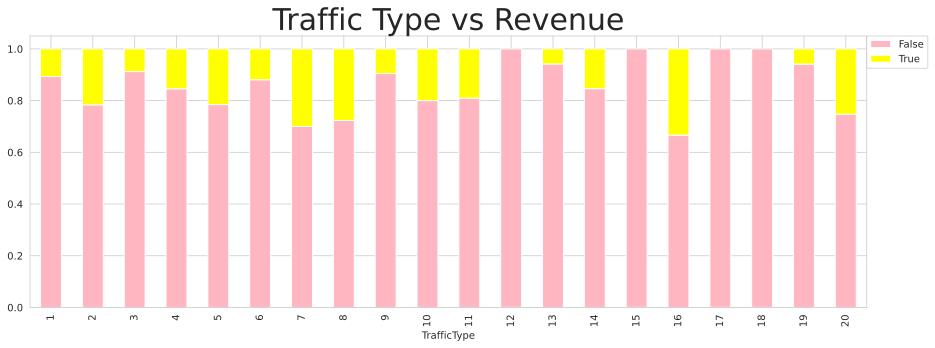

In [16]:
# Traffic Type vs Revenue

df = pd.crosstab(data['TrafficType'], data['Revenue'])
df.div(df.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['lightpink', 'yellow'])
plt.title('Traffic Type vs Revenue', fontsize = 30)
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.show()


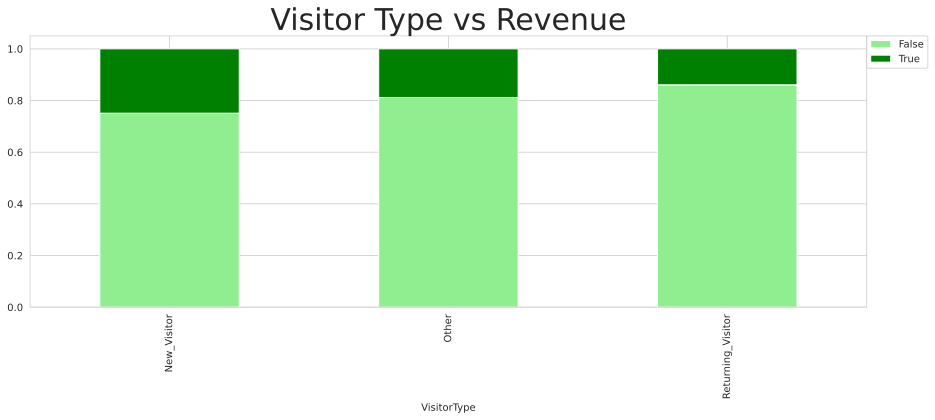

In [17]:
# visitor type vs revenue

df = pd.crosstab(data['VisitorType'], data['Revenue'])
df.div(df.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['lightgreen', 'green'])
plt.title('Visitor Type vs Revenue', fontsize = 30)
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.show()



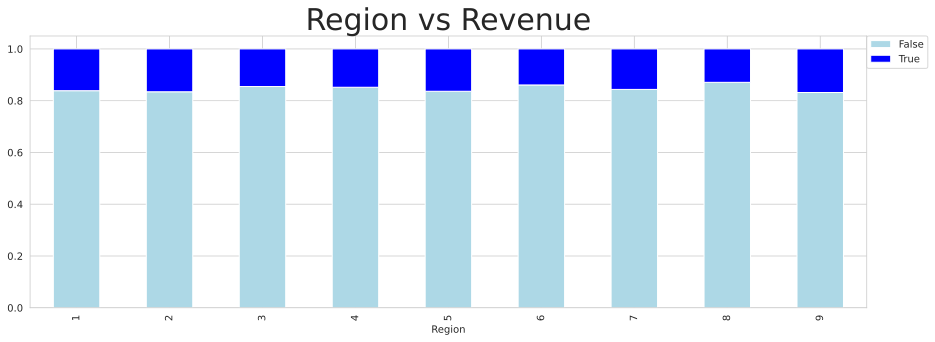

In [18]:
# region vs Revenue

df = pd.crosstab(data['Region'], data['Revenue'])
df.div(df.sum(1).astype(float), axis = 0).plot(kind = 'bar', stacked = True, figsize = (15, 5), color = ['lightblue', 'blue'])
plt.title('Region vs Revenue', fontsize = 30)
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.show()

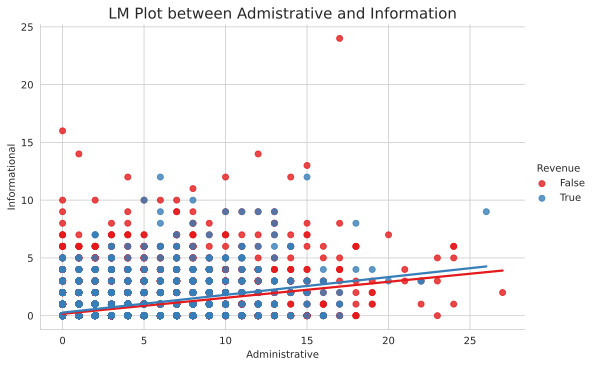

In [27]:
# lm plot(https://mp.weixin.qq.com/s/DBipRPqDMKLjaHZHbKLEEA)
# lmplot是用来绘制回归图的，通过lmplot我们可以直观地总览数据的内在关系
# lmplot是一种集合基础绘图与基于数据建立回归模型的绘图方法。旨在创建一个方便拟合数据集回归模型的绘图方法，利用'hue'、'col'、'row'参数来控制绘图变量。
# 同时可以使用模型参数来调节需要拟合的模型：order、logistic、lowess、robust、logx。
# https://zhuanlan.zhihu.com/p/25909753
plt.rcParams['figure.figsize'] = (20, 10)

sns.lmplot(x = 'Administrative', y = 'Informational', data = data, hue="Revenue", palette="Set1", ci = 0.95, aspect=1.5)
plt.title('LM Plot between Admistrative and Information', fontsize = 15)
plt.show()


### 4.数据的多变量分析

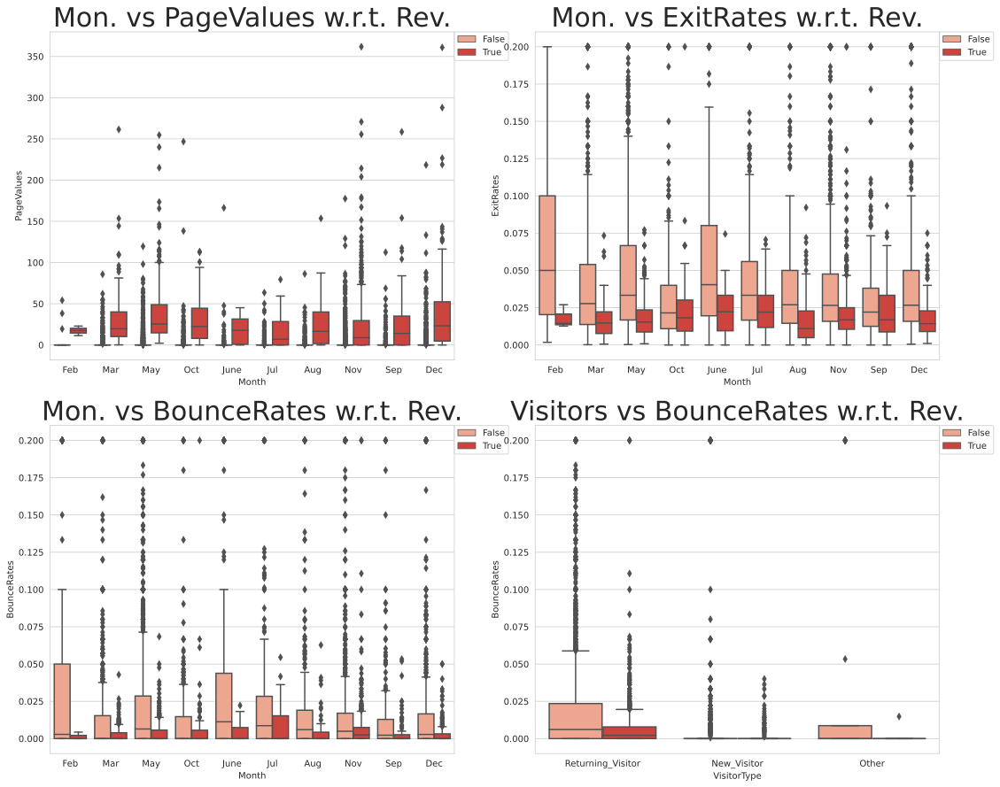

In [30]:
# month vs pagevalues wrt revenue

plt.rcParams['figure.figsize'] = (18, 15)
plt.subplot(2, 2, 1)
sns.boxplot(x = data['Month'], y = data['PageValues'], hue = data['Revenue'], palette = 'Reds')
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.title('Mon. vs PageValues w.r.t. Rev.', fontsize = 30)

# month vs exitrates wrt revenue
plt.subplot(2, 2, 2)
sns.boxplot(x = data['Month'], y = data['ExitRates'], hue = data['Revenue'], palette = 'Reds')
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.title('Mon. vs ExitRates w.r.t. Rev.', fontsize = 30)

# month vs bouncerates wrt revenue
plt.subplot(2, 2, 3)
sns.boxplot(x = data['Month'], y = data['BounceRates'], hue = data['Revenue'], palette = 'Reds')
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.title('Mon. vs BounceRates w.r.t. Rev.', fontsize = 30)

# visitor type vs exit rates w.r.t revenue
plt.subplot(2, 2, 4)
sns.boxplot(x = data['VisitorType'], y = data['BounceRates'], hue = data['Revenue'], palette = 'Reds')
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)
plt.title('Visitors vs BounceRates w.r.t. Rev.', fontsize = 30)

plt.show()

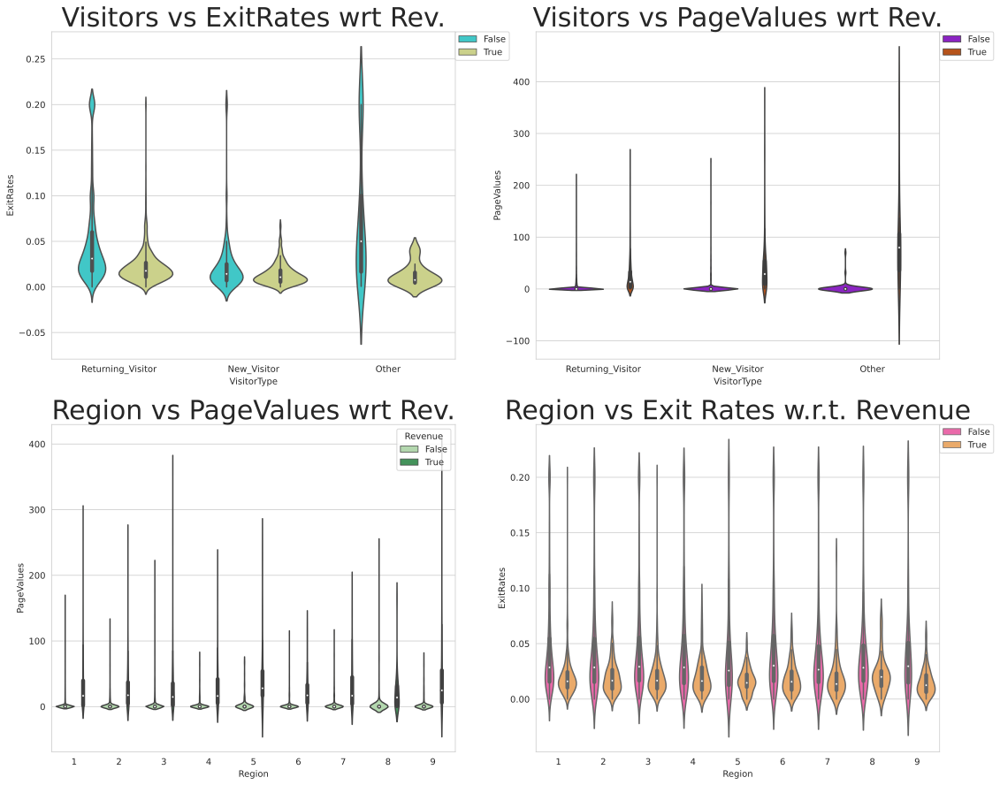

In [31]:
# visitor type vs exit rates w.r.t revenue

plt.rcParams['figure.figsize'] = (18, 15)
plt.subplot(2, 2, 1)
sns.violinplot(x = data['VisitorType'], y = data['ExitRates'], hue = data['Revenue'], palette = 'rainbow')
plt.title('Visitors vs ExitRates wrt Rev.', fontsize = 30)
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)

# visitor type vs exit rates w.r.t revenue
plt.subplot(2, 2, 2)
sns.violinplot(x = data['VisitorType'], y = data['PageValues'], hue = data['Revenue'], palette = 'gnuplot')
plt.title('Visitors vs PageValues wrt Rev.', fontsize = 30)
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)

# region vs pagevalues w.r.t. revenue
plt.subplot(2, 2, 3)
sns.violinplot(x = data['Region'], y = data['PageValues'], hue = data['Revenue'], palette = 'Greens')
plt.title('Region vs PageValues wrt Rev.', fontsize = 30)

#region vs exit rates w.r.t. revenue
plt.subplot(2, 2, 4)
sns.violinplot(x = data['Region'], y = data['ExitRates'], hue = data['Revenue'], palette = 'spring')
plt.title('Region vs Exit Rates w.r.t. Revenue', fontsize = 30)
plt.legend(loc = 2, bbox_to_anchor = (1.0, 1.0), borderaxespad = 0)

plt.show()

In [32]:
# 判断缺失值个数
data.isnull().sum()

Administrative             0
Administrative_Duration    0
Informational              0
Informational_Duration     0
ProductRelated             0
ProductRelated_Duration    0
BounceRates                0
ExitRates                  0
PageValues                 0
SpecialDay                 0
Month                      0
OperatingSystems           0
Browser                    0
Region                     0
TrafficType                0
VisitorType                0
Weekend                    0
Revenue                    0
dtype: int64

In [33]:
# 缺失值补零操作

data.fillna(0, inplace = True)

# checking the no. of null values in data after imputing the missing values
data.isnull().sum().sum()

0

## 双变量聚类分析

### 1.尝试了解用户在网站上花费的时间方面的特征


#### Administrative Duration vs Bounce Rate

在KElbowVisualizer实现“肘”方法来帮助数据科学家由模型与一个值的范围配合选择簇的最优数量的K. 如果折线图类似于手臂，那么“肘部”（曲线上的拐点）是一个很好的迹象，表明基础模型最适合该点。在可视化工具中，“肘部”将用虚线标注。

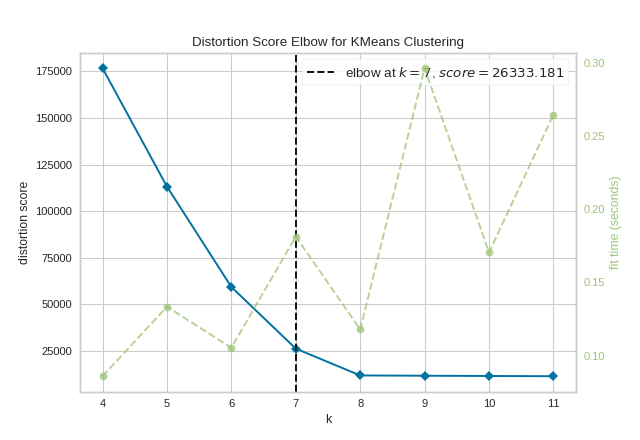

> 计算不同 k 值的聚类算法（例如，k 均值聚类）。 例如，通过将 k 从 1 更改为 10 个集群。

> 对于每个 k，计算总的簇内平方和 (wss)。

> 根据簇数 k 绘制 wss 的曲线。

> 曲线中弯曲（拐点）的位置通常被认为是适当数量的集群的指标。

(12330, 2)


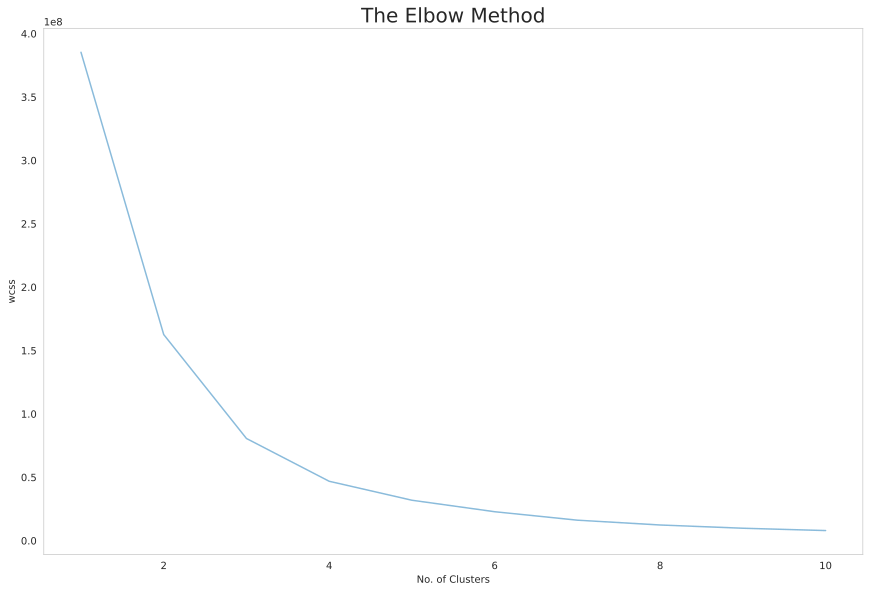

In [35]:
# Q1：用户在网站上花费的时间与跳出率

'''
跳出率：特定网站的访问者在仅查看一页后离开该网站的访问者的百分比。
'''
# 将用户持续时间和跳出率聚类到数据集中不同类型的聚类。
# 准备数据集
x = data.iloc[:, [1, 6]].values

print(x.shape)

from sklearn.cluster import KMeans

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i,
              init = 'k-means++',
              max_iter = 300,
              n_init = 10,
              random_state = 0,
              algorithm = 'elkan',
              tol = 0.001)
    km.fit(x)
    labels = km.labels_
    wcss.append(km.inertia_)
    
plt.rcParams['figure.figsize'] = (12, 8)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

**根据此图，最大弯曲位于第三个索引处，即最佳编号的数量。 管理持续时间和收入的集群数量是三个。让我们进入下一步，即绘制集群。**

**Visualizing the Cluster using Scatter Plot.**

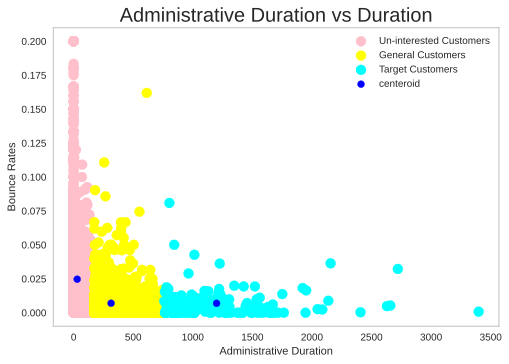

In [42]:
km = KMeans(n_clusters = 3, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Un-interested Customers')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'General Customers')
plt.scatter(x[y_means == 2, 0], x[y_means == 2, 1], s = 100, c = 'cyan', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.title('Administrative Duration vs Duration', fontsize = 20)
plt.grid()
plt.xlabel('Administrative Duration')
plt.ylabel('Bounce Rates')
plt.legend()
plt.show()

**通过，查看此聚类图，我们可以自信地说，在网站上花费较长管理时间的客户不太可能在浏览该网站的一页后从该网站跳出该网站。**

**分为三个组，粉红组是一组停留时间最短且最有可能离开 w 的客户**

#### Informative Duration vs Bounce Rates

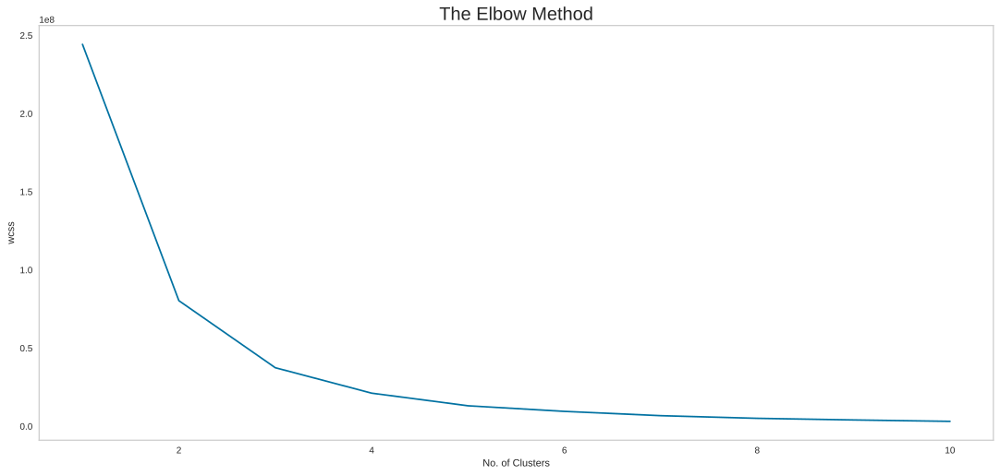

In [43]:
# informational duration vs Bounce Rates
x = data.iloc[:, [3, 6]].values

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i,
              init = 'k-means++',
              max_iter = 300,
              n_init = 10,
              random_state = 0,
              algorithm = 'elkan',
              tol = 0.001)
    km.fit(x)
    labels = km.labels_
    wcss.append(km.inertia_)
    
plt.rcParams['figure.figsize'] = (15, 7)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

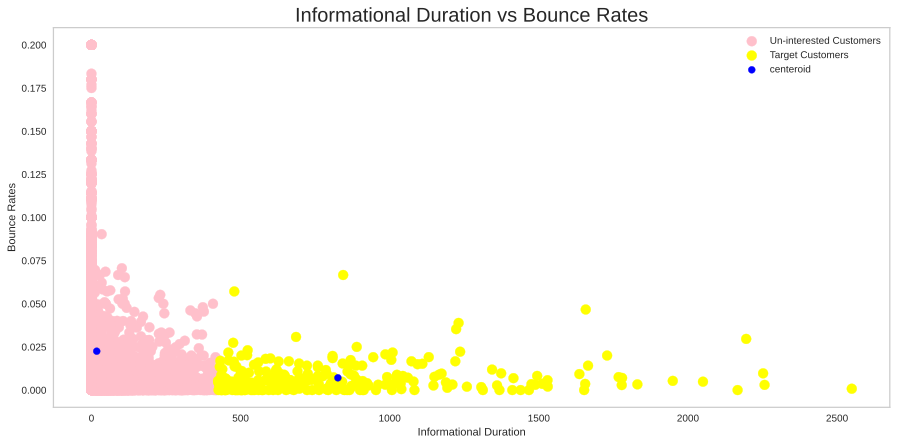

In [44]:
km = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Un-interested Customers')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.title('Informational Duration vs Bounce Rates', fontsize = 20)
plt.grid()
plt.xlabel('Informational Duration')
plt.ylabel('Bounce Rates')
plt.legend()
plt.show()

#### Administrative Duration vs Exit Rates

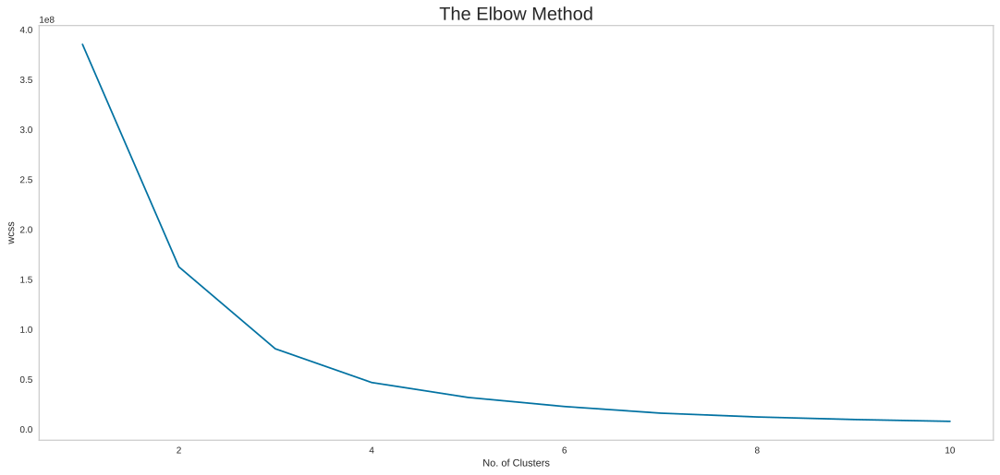

In [45]:
# informational duration vs Bounce Rates
x = data.iloc[:, [1, 7]].values

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i,
              init = 'k-means++',
              max_iter = 300,
              n_init = 10,
              random_state = 0,
              algorithm = 'elkan',
              tol = 0.001)
    km.fit(x)
    labels = km.labels_
    wcss.append(km.inertia_)
    
plt.rcParams['figure.figsize'] = (15, 7)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

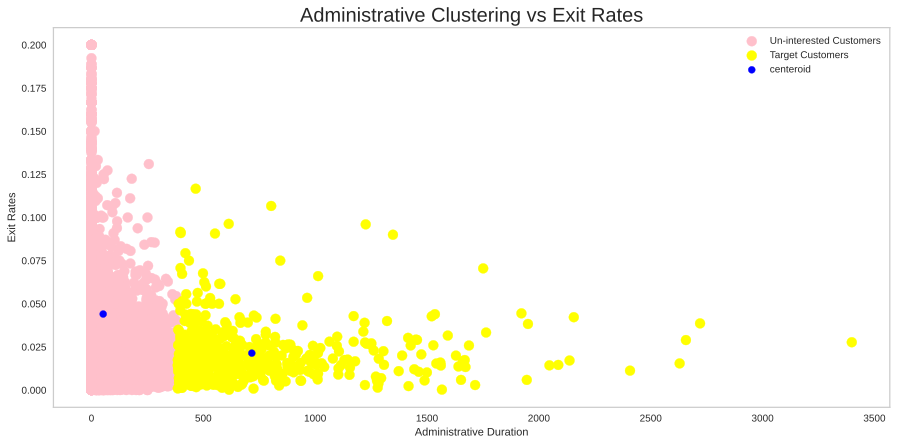

In [46]:
km = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Un-interested Customers')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.title('Administrative Clustering vs Exit Rates', fontsize = 20)
plt.grid()
plt.xlabel('Administrative Duration')
plt.ylabel('Exit Rates')
plt.legend()
plt.show()

### 2.网站的用户来自哪里？

#### Region vs Traffic Type

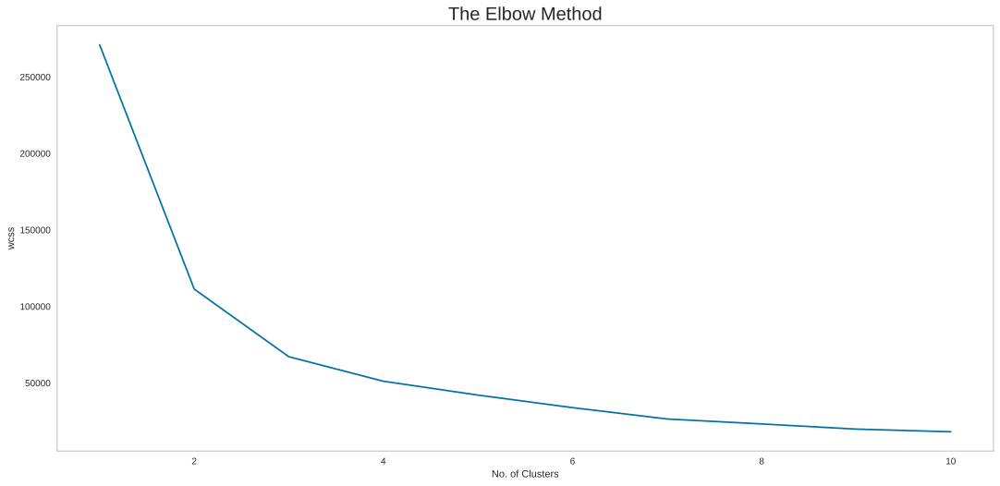

In [47]:
# informational duration vs Bounce Rates
x = data.iloc[:, [13, 14]].values

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i,
              init = 'k-means++',
              max_iter = 300,
              n_init = 10,
              random_state = 0,
              algorithm = 'elkan',
              tol = 0.001)
    km.fit(x)
    labels = km.labels_
    wcss.append(km.inertia_)
    
plt.rcParams['figure.figsize'] = (15, 7)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

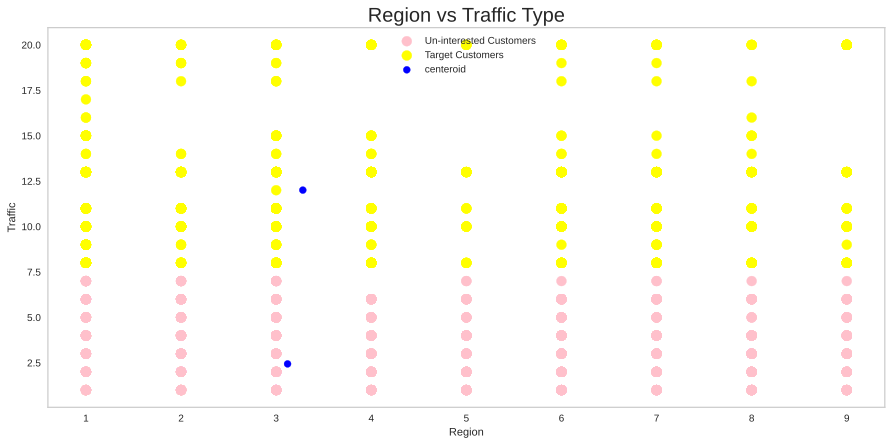

In [48]:
km = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Un-interested Customers')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.title('Region vs Traffic Type', fontsize = 20)
plt.grid()
plt.xlabel('Region')
plt.ylabel('Traffic')
plt.legend()
plt.show()

#### Adminstrative Duration vs Region

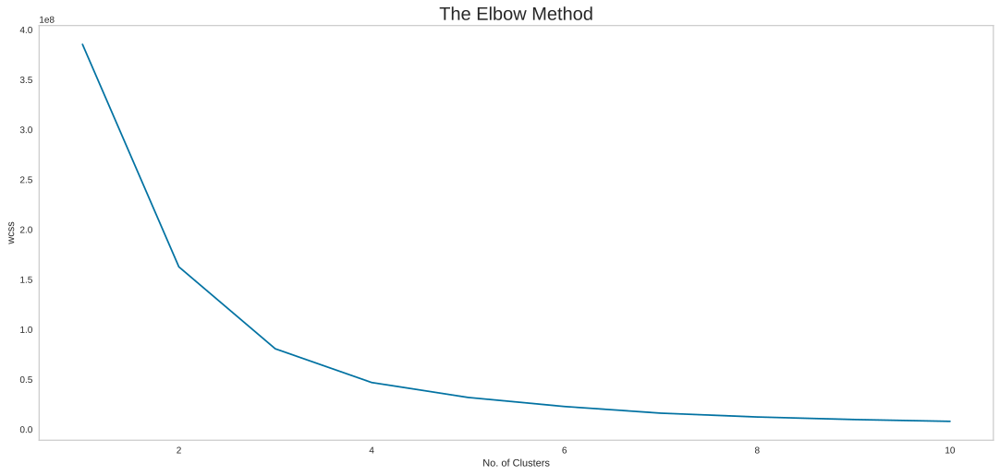

In [49]:
# informational duration vs Bounce Rates
x = data.iloc[:, [1, 13]].values

wcss = []
for i in range(1, 11):
    km = KMeans(n_clusters = i,
              init = 'k-means++',
              max_iter = 300,
              n_init = 10,
              random_state = 0,
              algorithm = 'elkan',
              tol = 0.001)
    km.fit(x)
    labels = km.labels_
    wcss.append(km.inertia_)
    
plt.rcParams['figure.figsize'] = (15, 7)
plt.plot(range(1, 11), wcss)
plt.grid()
plt.tight_layout()
plt.title('The Elbow Method', fontsize = 20)
plt.xlabel('No. of Clusters')
plt.ylabel('wcss')
plt.show()

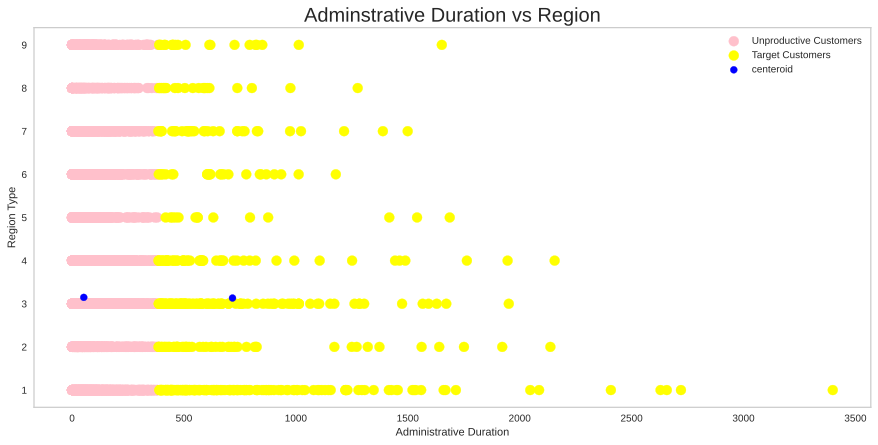

In [50]:
km = KMeans(n_clusters = 2, init = 'k-means++', max_iter = 300, n_init = 10, random_state = 0)
y_means = km.fit_predict(x)

plt.scatter(x[y_means == 0, 0], x[y_means == 0, 1], s = 100, c = 'pink', label = 'Unproductive Customers')
plt.scatter(x[y_means == 1, 0], x[y_means == 1, 1], s = 100, c = 'yellow', label = 'Target Customers')
plt.scatter(km.cluster_centers_[:,0], km.cluster_centers_[:, 1], s = 50, c = 'blue' , label = 'centeroid')

plt.title('Adminstrative Duration vs Region', fontsize = 20)
plt.grid()
plt.xlabel('Administrative Duration')
plt.ylabel('Region Type')
plt.legend()
plt.show()

## 数据准备

### 1.one-hot编码

In [51]:
# one hot encoding 

data1 = pd.get_dummies(data)

data1.columns

Index(['Administrative', 'Administrative_Duration', 'Informational',
       'Informational_Duration', 'ProductRelated', 'ProductRelated_Duration',
       'BounceRates', 'ExitRates', 'PageValues', 'SpecialDay',
       'OperatingSystems', 'Browser', 'Region', 'TrafficType', 'Weekend',
       'Revenue', 'Month_Aug', 'Month_Dec', 'Month_Feb', 'Month_Jul',
       'Month_June', 'Month_Mar', 'Month_May', 'Month_Nov', 'Month_Oct',
       'Month_Sep', 'VisitorType_New_Visitor', 'VisitorType_Other',
       'VisitorType_Returning_Visitor'],
      dtype='object')

In [52]:
# label encoding of revenue

from sklearn.preprocessing import LabelEncoder

le = LabelEncoder()
data['Revenue'] = le.fit_transform(data['Revenue'])
data['Revenue'].value_counts()

0    10422
1     1908
Name: Revenue, dtype: int64

In [53]:
# getting dependent and independent variables

x = data1
# removing the target column revenue from x
x = x.drop(['Revenue'], axis = 1)

y = data['Revenue']

# checking the shapes
print("Shape of x:", x.shape)
print("Shape of y:", y.shape)


Shape of x: (12330, 28)
Shape of y: (12330,)


### 2.数据采样与切片

In [54]:
# splitting the data

from sklearn.model_selection import train_test_split

x_train, x_test, y_train, y_test = train_test_split(x, y, test_size = 0.3, random_state = 0)

# checking the shapes

print("Shape of x_train :", x_train.shape)
print("Shape of y_train :", y_train.shape)
print("Shape of x_test :", x_test.shape)
print("Shape of y_test :", y_test.shape)

Shape of x_train : (8631, 28)
Shape of y_train : (8631,)
Shape of x_test : (3699, 28)
Shape of y_test : (3699,)


### 3.模型搭建

#### **Random Forest Classifier**

Training Accuracy : 1.0
Testing Accuracy : 0.8921330089213301
              precision    recall  f1-score   support

           0       0.91      0.96      0.94      3077
           1       0.75      0.54      0.63       622

    accuracy                           0.89      3699
   macro avg       0.83      0.75      0.78      3699
weighted avg       0.88      0.89      0.88      3699



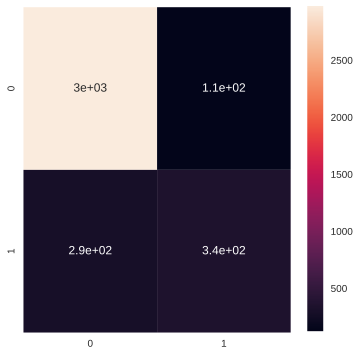

In [77]:
# 建模

from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

# 训练
model = RandomForestClassifier()
model.fit(x_train, y_train)

# 预测
y_pred = model.predict(x_test)

# 计算准确率
print("Training Accuracy :", model.score(x_train, y_train))
print("Testing Accuracy :", model.score(x_test, y_test))

# 绘制混淆矩阵（https://zhuanlan.zhihu.com/p/73558315）
cm = confusion_matrix(y_test, y_pred)
plt.rcParams['figure.figsize'] = (6, 6)
sns.heatmap(cm ,annot = True)

# 分类报告
cr = classification_report(y_test, y_pred)
print(cr)

### 4.模型解释

模型通常会考虑以下问题：

+ 哪些特征在模型看到是最重要的？
+ 从大量的记录整体来考虑，每一个特征如何影响模型的预测的？
+ 关于某一条记录的预测，每一个特征是如何影响到最终的预测结果的？

这就是可解释性机器学习需要解决的问题，也是他的价值所在：

- 可靠性
- 易于调试
- 启发特征工程思路
- 指导后续数据采集的方向
- 指导人为决策
- 建立模型和人之间的信任


[参考来源1](https://zhuanlan.zhihu.com/p/81244500)
[参考来源2](https://blog.csdn.net/weixin_44803791/article/details/109776357)

- **yellowbrick**：这个库本质上是scikit-learn学习库的扩展，并为机器学习模型提供了一些极其有用且好看的可视化。可视化工具对象、核心接口都是scikit-learn模拟估算器。如果你习惯于使用scikit-learn学习库，那么就一定不会对yellowbrick的工作流程感到陌生。获得的可视化包括模型选择、特征重要性与模型性能分析。

- **ELI5**：是另一个可视化库，可用于调试机器学习模型并解释模型所做出的预测。它可用于最常见的 Python机器学习库，如scikit-learn、 XGBoost 和 Keras。（Permutation Importance）

- **LIME**:(局部可解释模型-不可知论解释)是一个用于解释机器学习算法所做出的预测的软件包。Lime支持各种分类器对单个预测的解释，并内置支持scikit-learn。

- 特征重要性（模型自带Feature Importance）

- SHAP


当然，还有很多其他方法，部分依赖图(PDP)和个体条件期望图(ICE)、局部可解释不可知模型（LIME）、RETAIN、逐层相关性传播（LRP）。本文只写了我接触到的一小部分哈，实际工作用到可在拓展学习。

#### 特征重要性检查

使用ELI5检查上方训练后模型的特征重要性

In [57]:
!pip3 install eli5

     |████████████████████████████████| 106 kB 8.5 MB/s 


在训练模型的时候可以直接输出特征重要性，但这个特征对**整体的预测效果**有多大影响？可以用Permutation Importance（排列重要性）进行计算。
PI思想:基于“置换检验”的思想对特征重要性进行检测，，一定是在model训练完成后，才可以计算的。简单来说，就是改变数据表格中某一列的数据的排列，保持其余特征不动，看其对预测精度的影响有多大。


计算步骤：

1、用上全部特征，训练一个模型。

2、验证集预测得到得分。

3、验证集的一个特征列的值进行随机打乱，预测得到得分。

4、将上述得分做差即可得到特征x1对预测的影响。

5、依次将每一列特征按上述方法做，得到每二个特征对预测的影响。

In [78]:
# finding the Permutation importance
# https://zhuanlan.zhihu.com/p/45261366
import eli5
from eli5.sklearn import PermutationImportance

perm = PermutationImportance(model, random_state = 0).fit(x_test, y_test)
eli5.show_weights(perm, feature_names = x_test.columns.tolist())

Weight,Feature
0.1242 ± 0.0148,PageValues
0.0081 ± 0.0031,Month_Nov
0.0066 ± 0.0067,ExitRates
0.0044 ± 0.0028,ProductRelated
0.0037 ± 0.0015,BounceRates
0.0032 ± 0.0020,ProductRelated_Duration
0.0021 ± 0.0013,Region
0.0011 ± 0.0011,Month_May
0.0009 ± 0.0009,Month_Dec
0.0008 ± 0.0023,Administrative


In [79]:
# 特征重要性的作用 -> 快速的让你知道哪些因素是比较重要的，
# 但是不能得到这个因素对模型结果的正负向影响，同时传统方法对交互效应的考量会有些欠缺。
model.feature_importances_

array([4.35220289e-02, 5.90964573e-02, 1.77244078e-02, 2.59553172e-02,
       7.57124603e-02, 8.25374609e-02, 5.63830009e-02, 8.53457383e-02,
       3.63218360e-01, 3.37123130e-03, 1.85563155e-02, 2.01465592e-02,
       3.16009688e-02, 3.15561527e-02, 1.05423485e-02, 3.66922992e-03,
       6.26486790e-03, 2.20068153e-04, 4.50620878e-03, 2.38488263e-03,
       4.44069658e-03, 6.47971158e-03, 2.00492117e-02, 3.54067405e-03,
       4.09619674e-03, 7.29969162e-03, 6.47160427e-04, 1.11325921e-02])

In [75]:
eli5.show_weights(model, feature_names = x_test.columns.tolist())

Weight,Feature
0.3553 ± 0.0911,PageValues
0.0873 ± 0.0385,ProductRelated_Duration
0.0852 ± 0.0440,ExitRates
0.0758 ± 0.0286,ProductRelated
0.0598 ± 0.0289,Administrative_Duration
0.0556 ± 0.0263,BounceRates
0.0436 ± 0.0200,Administrative
0.0321 ± 0.0113,Region
0.0312 ± 0.0112,TrafficType
0.0265 ± 0.0144,Informational_Duration


In [76]:
# 也可以用show_prediction检查单独预测的原因
from eli5 import show_prediction

show_prediction(model, x_train.iloc[1], feature_names = x.columns.tolist(),
                 show_feature_values=True)

**Partial Dependency Plots**

In [60]:
!pip3 install pdpbox

     |████████████████████████████████| 34.0 MB 43 kB/s 
     |████████████████████████████████| 13.1 MB 6.9 kB/s 
  Created wheel for pdpbox: filename=PDPbox-0.2.1-py3-none-any.whl size=35758225 sha256=2d95b79ba2f6894f97c5b7c194477aa3dc1fa29445eb6bb51e3962904bf63467
  Stored in directory: /root/.cache/pip/wheels/f4/d0/1a/b80035625c53131f52906a6fc4dd690d8efd2bf8af6a4015eb
Successfully built pdpbox
  Attempting uninstall: matplotlib
    Found existing installation: matplotlib 3.2.2
    Uninstalling matplotlib-3.2.2:
      Successfully uninstalled matplotlib-3.2.2
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
albumentations 0.1.12 requires imgaug<0.2.7,>=0.2.5, but you have imgaug 0.2.9 which is incompatible.


findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.
findfont: Font family ['Arial'] not found. Falling back to DejaVu Sans.


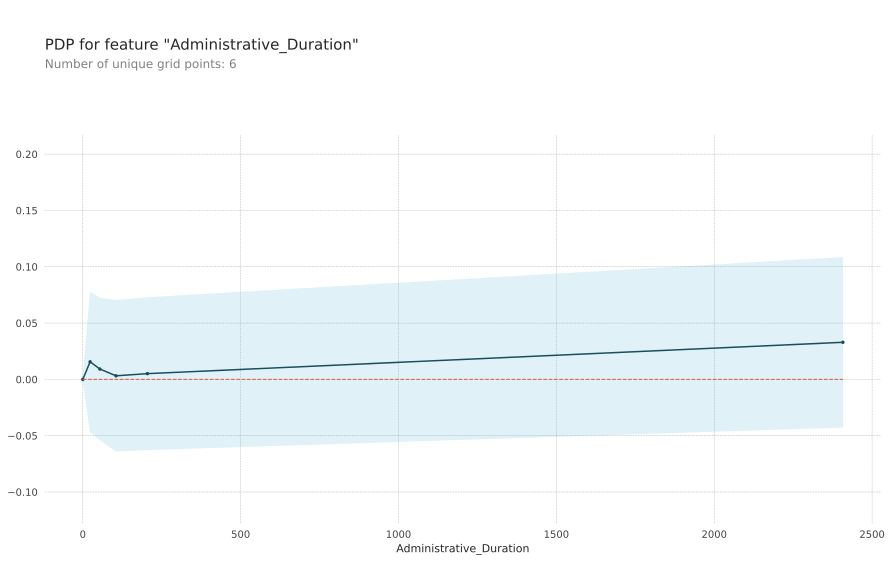

In [61]:
# plotting the partial dependence plot for adminisrative duration

# importing pdp
from pdpbox import pdp, info_plots

base_features = x_test.columns.values.tolist()

feat_name = 'Administrative_Duration'
pdp_dist = pdp.pdp_isolate(model=model, dataset=x_test, model_features = base_features, feature = feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

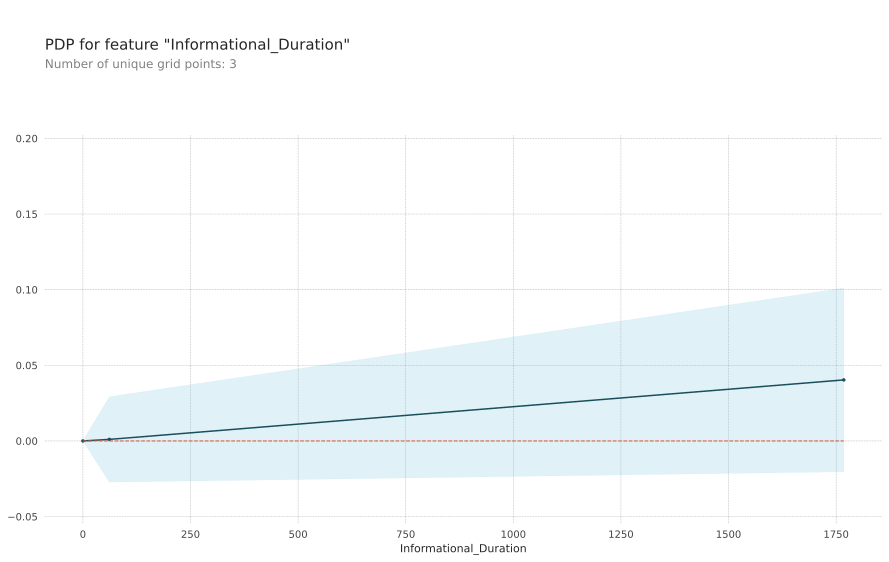

In [62]:
# plotting partial dependency plot for Informational Duration

base_features = x_test.columns.tolist()

feat_name = 'Informational_Duration'
pdp_dist = pdp.pdp_isolate(model, x_test, base_features, feat_name)

pdp.pdp_plot(pdp_dist, feat_name)
plt.show()

以上都是全局可解释性方法，那局部可解释性，即单个样本来看，模型给出的预测值和某些特征可能的关系，这就可以用到SHAP。当然shap也有全局可解释性哈

SHAP（Shapley Additive exPlanations） 使用来自博弈论及其相关扩展的经典 Shapley value将最佳信用分配与局部解释联系起来，是一种基于游戏理论上最优的 Shapley value来解释个体预测的方法。

从博弈论的角度，把数据集中的每一个特征变量当成一个玩家，用该数据集去训练模型得到预测的结果，可以看成众多玩家合作完成一个项目的收益。Shapley value 通过考虑各个玩家做出的贡献，来公平的分配合作的收益。




**Shap Values**

In [64]:
!pip3 install shap

     |████████████████████████████████| 356 kB 7.1 MB/s 
  Created wheel for shap: filename=shap-0.39.0-cp37-cp37m-linux_x86_64.whl size=491640 sha256=3cba2d45df6b4f65e11afa268031d0cfd83794d700cc626aaddb85bac07b8814
  Stored in directory: /root/.cache/pip/wheels/ca/25/8f/6ae5df62c32651cd719e972e738a8aaa4a87414c4d2b14c9c0
Successfully built shap


In [80]:
# import shap  #Python的可解释机器学习库 pip install shap
# shap.initjs()  # notebook环境下，加载用于可视化的JS代码

#模型还是用之前训练的model

'''
#在SHAP中进行模型解释需要先创建一个explainer，
#SHAP支持很多类型的explainer(例如deep, gradient, kernel, linear, tree, sampling)
#我们先以tree为例，因为它支持常用的XGB、LGB、CatBoost等树集成算法。
'''

# explainer = shap.TreeExplainer(clf)
# shap_values = explainer.shap_values(df)  # 传入特征矩阵，计算SHAP值

# j = 60
# y_base = explainer.expected_value
# player_explainer = pd.DataFrame()
# player_explainer['feature'] = df.columns
# player_explainer['feature_value'] = df.iloc[j].values
# player_explainer['shap_value'] = shap_values[j]
# player_explainer

'\n#在SHAP中进行模型解释需要先创建一个explainer，\n#SHAP支持很多类型的explainer(例如deep, gradient, kernel, linear, tree, sampling)\n#我们先以tree为例，因为它支持常用的XGB、LGB、CatBoost等树集成算法。\n'

#### 全局重要性

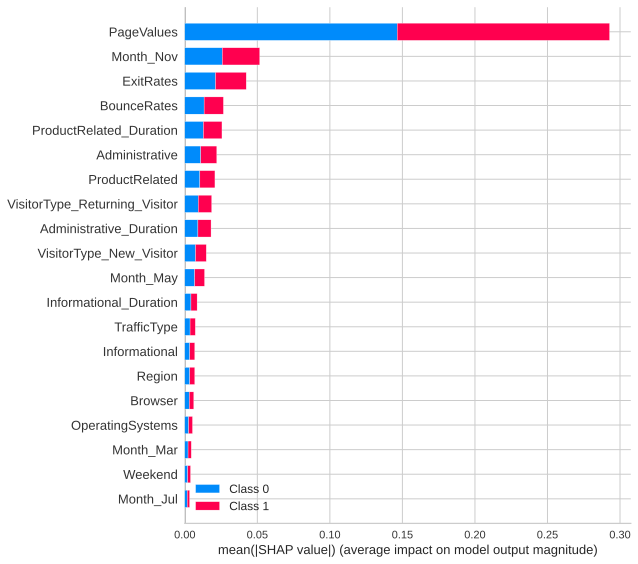

In [82]:
import shap
# 在SHAP中进行模型解释需要先创建一个 explainer
explainer = shap.TreeExplainer(model)
# 然后计算shap_values值，计算非常简单，直接利用上面得到的解释器解释训练样本x_test
# 输出 numpy.array 数组
shap_values = explainer.shap_values(x_test)


# 将 SHAP 值矩阵传递给条形图函数会创建一个全局特征重要性图，其中每个特征的全局重要性被视为该特征在所有给定样本中的平均绝对值。
shap.summary_plot(shap_values, x_test, plot_type = 'bar')

In [87]:
print(shap_values)
print(shap_values.shape)

.values =
array([[[ 4.62308101e-03, -4.62308101e-03],
        [ 5.99807935e-03, -5.99807935e-03],
        [-1.05773999e-03,  1.05773999e-03],
        ...,
        [ 7.10688897e-03, -7.10688897e-03],
        [-2.58853586e-05,  2.58853586e-05],
        [ 6.24623212e-03, -6.24623212e-03]],

       [[-2.74773648e-02,  2.74773648e-02],
        [-1.72504137e-02,  1.72504137e-02],
        [-4.40820937e-05,  4.40820937e-05],
        ...,
        [ 6.00836548e-03, -6.00836548e-03],
        [-1.52248533e-04,  1.52248533e-04],
        [ 8.18153160e-03, -8.18153160e-03]],

       [[-1.93737944e-02,  1.93737944e-02],
        [ 6.89913113e-03, -6.89913113e-03],
        [ 5.96330763e-03, -5.96330763e-03],
        ...,
        [ 7.95402649e-03, -7.95402649e-03],
        [ 1.46945786e-05, -1.46945786e-05],
        [ 5.40961331e-03, -5.40961331e-03]],

       ...,

       [[-1.61043552e-02,  1.61043552e-02],
        [-1.66129320e-02,  1.66129320e-02],
        [ 3.58568732e-03, -3.58568732e-03],
        

#### 局部重要性

将一行 SHAP 值传递给条形图函数会创建一个局部特征重要性图，其中条形是每个特征的 SHAP 值。其中特征值是否显示，是通过参数show_data控制，默认 'auto' 特征值以灰色显示在特征名称的左侧。

## 结论分析

### 消费者分析

In [66]:
# let's create a function to check the customer's conditions

def customer_analysis(model, customer):
    explainer = shap.TreeExplainer(model)
    shap_values = explainer.shap_values(customer)
    shap.initjs()
    return shap.force_plot(explainer.expected_value[1], shap_values[1], customer)

In [67]:
# let's do some real time prediction for patients

customers = x_test.iloc[1,:].astype(float)
customer_analysis(model, customers)

In [68]:
# let's do some real time prediction for patients

customers = x_test.iloc[15,:].astype(float)
customer_analysis(model, customers)

In [69]:
# let's do some real time prediction for patients

customers = x_test.iloc[100,:].astype(float)
customer_analysis(model, customers)

In [70]:
# let's do some real time prediction for patients

customers = x_test.iloc[150,:].astype(float)
customer_analysis(model, customers)

In [71]:
# let's do some real time prediction for patients

customers = x_test.iloc[200,:].astype(float)
customer_analysis(model, customers)

**Force Plot**

In [72]:
shap_values = explainer.shap_values(x_train.iloc[:50])
shap.initjs()

shap.force_plot(explainer.expected_value[1], shap_values[1], x_test.iloc[:50])